# Importações e Bibliotecas

In [519]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [520]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [521]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [522]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [523]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 150
MAX_GENERATIONS: int = 3000
BESTS: int = 2

In [524]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [525]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
8465 products loaded.


In [526]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [527]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [528]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [529]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [530]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [531]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [532]:
c: list[int] = gerar_carrinho()
c

[1466958,
 351393,
 327990,
 477417,
 1623323,
 89959,
 347965,
 537882,
 1609341,
 1588339,
 1602856,
 180735,
 441609,
 332563,
 61403,
 444823,
 22306,
 427067,
 273428,
 538524,
 315045,
 217386,
 139908,
 128978,
 397283,
 397574,
 1373108,
 470100,
 142015,
 1598116,
 144277,
 413063,
 144398,
 459465,
 1069132,
 435333,
 1614240,
 115182,
 92194,
 324722,
 1602739,
 284911,
 9808,
 1560835,
 691353,
 653610,
 33355,
 349742,
 10669,
 410980,
 166561,
 668554,
 348065,
 473749,
 416944,
 1593274,
 1616004,
 1616058,
 1618648,
 458936,
 341414,
 1623252,
 276662,
 448987,
 1571695,
 1614229,
 660003,
 463525,
 424291,
 675,
 659720,
 132257,
 312401,
 477882,
 1619267,
 1574784,
 1386008,
 456515,
 1286775,
 354211,
 1602837,
 313057,
 1575886,
 14256,
 55523,
 1602737,
 129104,
 23041,
 1574772,
 140851,
 1450015,
 1070273,
 39738,
 344569,
 42810,
 430060,
 133853,
 1618856,
 171818,
 409889]

### Geração de População Inicial

In [533]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [534]:
p: list[list[int]] = gerar_populacao()
p

[[1572743,
  1452963,
  464183,
  230918,
  1618341,
  51365,
  3239,
  475283,
  469995,
  446237,
  421962,
  1566618,
  663371,
  616529,
  1614970,
  442104,
  1619140,
  647067,
  478018,
  37966,
  198069,
  409969,
  382632,
  493184,
  428241,
  1616765,
  1065155,
  1616343,
  382034,
  446736,
  1452061,
  1450680,
  389626,
  1378033,
  411986,
  511963,
  136870,
  180330,
  283401,
  440670,
  325718,
  407531,
  1572796,
  1441724,
  1623221,
  554632,
  215282,
  1624658,
  1606548,
  1456394,
  1052620,
  72429,
  441613,
  1468877,
  1618537,
  412944,
  1614047,
  1624652,
  339456,
  1466942,
  1517051,
  1531885,
  14957,
  578553,
  1614050,
  540015,
  1623328,
  453213,
  1623643,
  327477,
  177700,
  12263,
  115258,
  1313583,
  426768,
  658760,
  1578859,
  434307,
  50277,
  434954,
  749375,
  456697,
  137138,
  145358,
  1617232,
  1618847,
  381537,
  1375784,
  1609274,
  62539,
  40358,
  456485,
  1559878,
  1607129,
  1618919,
  70251,
  1616632,
  

### Avaliação

In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
    'essencial': 0.35,
    'alimentos': 0.25,
    'açougue': 0.10,
    'beleza-e-perfumaria': 0.05,
    'bebidas': 0.10,
    'bebidas-alcoolicas': 0.015,
    'bebidas-alcoolicas-': 0.015,
    'limpeza': 0.05,
    'cuidados-pessoais': 0.07
}


    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
        
    nota = 1
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    
    # quanto maior o peso da categoria, menor a penalizacao
    repeticoes_categoria = sum([(1 / pesos[c]) * categorias.count(c)**2 for c in set(categorias)])

    # atualizacao proporcional da nota
    # soma 1 para garantir que a nota nao seja multiplicada por um decimal, que consequentemente diminuiria a nota
    nota *= (1 + repeticoes_categoria / len(individuo))
    
    # Bônus
    nota/= len(set(categorias))**2
    
    return nota**2 


In [536]:
n: float = avaliar(c)
n

8.407350962655526e+16

In [537]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [538]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{22.079404575002286: [163199,
  1618533,
  1625179,
  381476,
  412085,
  407932,
  709901,
  1616720,
  1517677,
  335049,
  1614101,
  425078,
  455066,
  670156,
  463524,
  1433122,
  1070278,
  468933,
  816707,
  1536335,
  1122624,
  466098,
  142766,
  788816,
  705584,
  329995,
  442583,
  1624718,
  678405,
  409722,
  72624,
  348909,
  387971,
  57653,
  594473,
  622944,
  1551945,
  63493,
  1446560,
  457109,
  429684,
  1373100,
  1616748,
  343055,
  355907,
  1539153,
  461512,
  1618490,
  221359,
  176544,
  564770,
  1606433,
  477682,
  1593278,
  1574781,
  1404204,
  477893,
  400358,
  1466438,
  1433127,
  696690,
  1616381,
  470165,
  537882,
  67428,
  1613998,
  101019,
  1572647,
  380029,
  185838,
  1556322,
  495786,
  1602831,
  177670,
  1615247,
  129197,
  55835,
  1617105,
  365820,
  1599571,
  1616341,
  100344,
  1591455,
  1547559,
  380651,
  96961,
  1313579,
  1378043,
  176287,
  176304,
  328304,
  1253480,
  460933,
  686642,
  1618700,

### Seleção

In [539]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [540]:
v1: list[list[int]] = torneio(p)
v1

[[443893,
  1372752,
  444521,
  498809,
  441286,
  1572638,
  426618,
  81017,
  448842,
  122481,
  1404446,
  1463453,
  1606368,
  62198,
  1619269,
  342386,
  1600557,
  52721,
  1435291,
  72643,
  456324,
  404862,
  1613347,
  656526,
  190423,
  1613931,
  553235,
  1606323,
  139780,
  178154,
  401849,
  219177,
  1253479,
  460710,
  1450015,
  648351,
  449630,
  1606780,
  71839,
  9260,
  1574786,
  1568064,
  1550457,
  1376069,
  1606365,
  95524,
  44559,
  418883,
  198099,
  658759,
  262342,
  1058549,
  160381,
  150677,
  328418,
  430076,
  429668,
  236594,
  309984,
  1602896,
  711958,
  616127,
  1496552,
  169156,
  13340,
  428531,
  327477,
  1545259,
  459337,
  1404752,
  326571,
  618724,
  479476,
  236990,
  711969,
  154884,
  37415,
  1628300,
  159442,
  183352,
  411987,
  1616724,
  1616498,
  356549,
  421082,
  538522,
  326861,
  1593262,
  197222,
  87534,
  443744,
  333494,
  614012,
  412860,
  439524,
  362698,
  1615661,
  346283,
  1

In [541]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [542]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[163199,
  1618533,
  1625179,
  381476,
  412085,
  407932,
  709901,
  1616720,
  1517677,
  335049,
  1614101,
  425078,
  455066,
  670156,
  463524,
  1433122,
  1070278,
  468933,
  816707,
  1536335,
  1122624,
  466098,
  142766,
  788816,
  705584,
  329995,
  442583,
  1624718,
  678405,
  409722,
  72624,
  348909,
  387971,
  57653,
  594473,
  622944,
  1551945,
  63493,
  1446560,
  457109,
  429684,
  1373100,
  1616748,
  343055,
  355907,
  1539153,
  461512,
  1618490,
  221359,
  176544,
  564770,
  1606433,
  477682,
  1593278,
  1574781,
  1404204,
  477893,
  400358,
  1466438,
  1433127,
  696690,
  1616381,
  470165,
  537882,
  67428,
  1613998,
  101019,
  1572647,
  380029,
  185838,
  1556322,
  495786,
  1602831,
  177670,
  1615247,
  129197,
  55835,
  1617105,
  365820,
  1599571,
  1616341,
  100344,
  1591455,
  1547559,
  380651,
  96961,
  1313579,
  1378043,
  176287,
  176304,
  328304,
  1253480,
  460933,
  686642,
  1618700,
  270364,
  131958,

In [543]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [544]:
e: list[list[int]] = eugenia(p)
e

[[163199,
  1618533,
  1625179,
  381476,
  412085,
  407932,
  709901,
  1616720,
  1517677,
  335049,
  1614101,
  425078,
  455066,
  670156,
  463524,
  1433122,
  1070278,
  468933,
  816707,
  1536335,
  1122624,
  466098,
  142766,
  788816,
  705584,
  329995,
  442583,
  1624718,
  678405,
  409722,
  72624,
  348909,
  387971,
  57653,
  594473,
  622944,
  1551945,
  63493,
  1446560,
  457109,
  429684,
  1373100,
  1616748,
  343055,
  355907,
  1539153,
  461512,
  1618490,
  221359,
  176544,
  564770,
  1606433,
  477682,
  1593278,
  1574781,
  1404204,
  477893,
  400358,
  1466438,
  1433127,
  696690,
  1616381,
  470165,
  537882,
  67428,
  1613998,
  101019,
  1572647,
  380029,
  185838,
  1556322,
  495786,
  1602831,
  177670,
  1615247,
  129197,
  55835,
  1617105,
  365820,
  1599571,
  1616341,
  100344,
  1591455,
  1547559,
  380651,
  96961,
  1313579,
  1378043,
  176287,
  176304,
  328304,
  1253480,
  460933,
  686642,
  1618700,
  270364,
  131958,

### Crossover e Mutação

In [545]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [546]:
f: list[list[int]] = cruzamento(v1)
f

[[443893,
  1372752,
  444521,
  498809,
  441286,
  1572638,
  426618,
  81017,
  448842,
  122481,
  1404446,
  1463453,
  1606368,
  62198,
  1619269,
  342386,
  1600557,
  52721,
  1435291,
  72643,
  456324,
  404862,
  1613347,
  656526,
  190423,
  1613931,
  553235,
  1606323,
  139780,
  178154,
  401849,
  219177,
  1253479,
  460710,
  1450015,
  648351,
  449630,
  1606780,
  71839,
  9260,
  1574786,
  1568064,
  1550457,
  1376069,
  1606365,
  95524,
  44559,
  418883,
  198099,
  658759,
  1619121,
  433107,
  327791,
  751152,
  201984,
  43619,
  93766,
  1617731,
  458825,
  596302,
  711958,
  616127,
  1496552,
  169156,
  13340,
  428531,
  327477,
  1545259,
  459337,
  1404752,
  326571,
  618724,
  479476,
  236990,
  711969,
  154884,
  37415,
  1628300,
  159442,
  183352,
  411987,
  1616724,
  1616498,
  356549,
  421082,
  538522,
  1618919,
  412738,
  1616106,
  1616919,
  135096,
  1074958,
  119606,
  1591035,
  521349,
  180954,
  412714,
  34741,
  

In [547]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [548]:
mt: list[list[Produto]] = mutar(f)
mt

[[443893,
  1372752,
  444521,
  513077,
  441286,
  1572638,
  426618,
  81017,
  448842,
  122481,
  1404446,
  1463453,
  304325,
  62198,
  1619269,
  342386,
  1600557,
  52721,
  1435291,
  72643,
  456324,
  404862,
  1613347,
  656526,
  190423,
  1613931,
  553235,
  1606323,
  139780,
  178154,
  401849,
  219177,
  1253479,
  460710,
  1450015,
  648351,
  449630,
  1606780,
  71839,
  9260,
  1574786,
  1568064,
  1550457,
  1376069,
  1606365,
  95524,
  44559,
  418883,
  198099,
  409373,
  1619121,
  433107,
  327791,
  751152,
  30022,
  43619,
  715822,
  1617731,
  458825,
  596302,
  711958,
  616127,
  1496552,
  169156,
  13340,
  1602149,
  327477,
  1545259,
  459337,
  1404752,
  326571,
  618724,
  479476,
  236990,
  711969,
  154884,
  37415,
  1628300,
  159442,
  183352,
  411987,
  1616724,
  1616498,
  356549,
  421082,
  1583425,
  1618919,
  412738,
  1616106,
  1616919,
  135096,
  1074958,
  119606,
  1591035,
  521349,
  180954,
  412714,
  34741,
 

# Execução Principal

In [549]:
relatorio: dict[dict[str: float]] = {}

In [550]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [551]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 5.332626550351297e+21, 'min': 7.429112760638107, 'med': 12386772.733431028}
Geração: 2 - {'max': 9.067079349360233e+17, 'min': 7.005317071464003, 'med': 4454118.519575544}
Geração: 3 - {'max': 6569399326.978677, 'min': 4.66356847516124, 'med': 1331117.5438745548}
Geração: 4 - {'max': 7.611326781875024e+16, 'min': 3.488484023334477, 'med': 518232.4534720047}
Geração: 5 - {'max': 9655978739.983757, 'min': 3.488484023334477, 'med': 304884.3151255904}
Geração: 6 - {'max': 9922779603685726.0, 'min': 3.488484023334477, 'med': 12435.213569391044}
Geração: 7 - {'max': 1.2661858353735912e+16, 'min': 3.4843566535022275, 'med': 576.5197957624716}
Geração: 8 - {'max': 3.3207030434804495e+18, 'min': 3.2180267996036496, 'med': 275.0573997058824}
Geração: 9 - {'max': 143663965.86889127, 'min': 3.2180267996036496, 'med': 11.126668874552458}
Geração: 10 - {'max': 24825943.128307007, 'min': 3.0596405854563535, 'med': 8.21718056640625}
Geração: 11 - {'max': 7605136018322963.0, 'min':

In [552]:
plot_generations(relatorio)

In [553]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 601

 [INDIVÍDUO]
Nota: 1.5650730749038935
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1583.26
Peso Total: 47.56g
Volume Total: 117166.17cm³
Preço médio: R$15.8326

[PRODUTOS]
Menor preço: R$1.69
Maior preço: R$83.9
Menor peso: 9.4g
Maior peso: 2124.0g
Menor volume: 32.4cm³
Maior volume: 7020.0cm³

[CATEGORIAS]:
- cuidados-pessoais: 7
- bebidas-alcoolicas: 1
- bebidas-alcoolicas-: 2
- limpeza: 5
- beleza-e-perfumaria: 5
- essencial: 35
- alimentos: 25
- açougue: 10
- bebidas: 10

[LISTAGEM]
Energético Diet Monster Absolutely Zero Lata 473ml 	 R$9.49 	 526.00g 	 654.88cm³
Aparelho Descartável para Barbear Bic Flex 3 Leve 4 Pague 3 Unidades	 	 R$25.49 	 105.10g 	 564.00cm³
Almôndega Vegetal Fazenda Futuro Bandeja 275g 11 Unidades 	 R$23.90 	 315.60g 	 1380.00cm³
Yakissoba Sadia Pacote 600g 	 R$29.49 	 720.00g 	 1298.60cm³
Farinha De Mandioca Torrada YOKI Pacote 500g 	 R$8.99 	 522.70g 	 875.52cm³
Vinagre Balsâmico Modena Giovanna Pavarotti Vidro 250ml 	 R$54.90

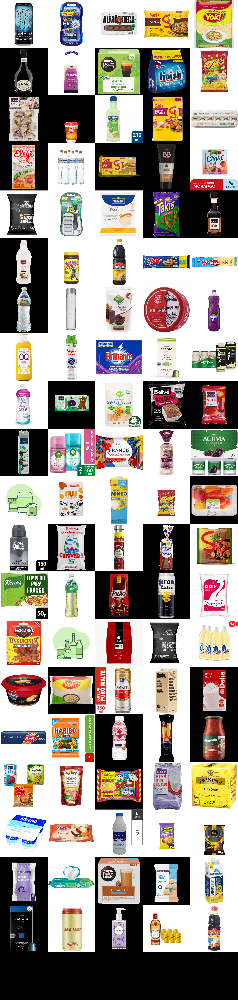

In [554]:
mosaic(best_cart)